# **Data Analysis on Electric Vehicle**
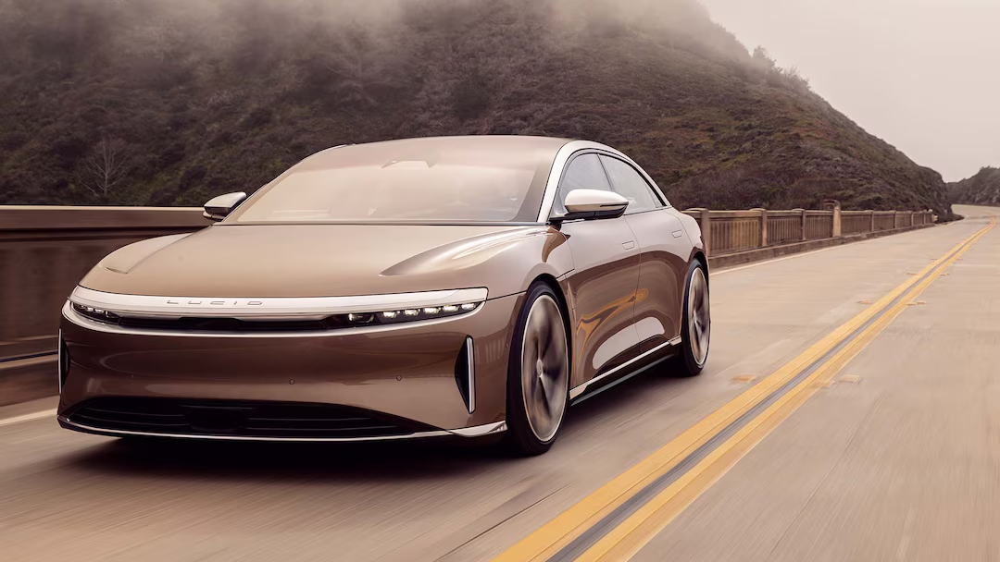

**AIM**: The objective of this project is to analyze Electric Vehicle (EV) data through Exploratory Data Analysis **(EDA)** techniques, visualize the **geographic distribution** of EVs using a Choropleth map, and create a **dynamic Racing Bar Plot** to showcase the yearly trends in EV make counts.

**DOMAIN**: Data Science

## About the Dataset

The dataset consists of **112,634** records of electric vehicles (EVs) with **17 columns**. Key fields include information like vehicle identification number **(VIN)**, the make and **model** of the EV, model **year**, **type** of electric vehicle (battery electric, plug-in hybrid, etc.), electric **range**, **base MSRP**, and **geographic data** such as county, city, state, postal code, and vehicle **location**. The dataset also contains eligibility for clean alternative fuel vehicles (CAFV) and relevant census and utility information.

## Import the Modules

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

## Data OverView

In [2]:
df=pd.read_csv('/kaggle/input/ev-analysis/dataset.csv')
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [3]:
print("Shape of our dataset : ",df.shape)

Shape of our dataset :  (112634, 17)


In [4]:
df.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

In [5]:
df.dtypes

VIN (1-10)                                            object
County                                                object
City                                                  object
State                                                 object
Postal Code                                            int64
Model Year                                             int64
Make                                                  object
Model                                                 object
Electric Vehicle Type                                 object
Clean Alternative Fuel Vehicle (CAFV) Eligibility     object
Electric Range                                         int64
Base MSRP                                              int64
Legislative District                                 float64
DOL Vehicle ID                                         int64
Vehicle Location                                      object
Electric Utility                                      object
2020 Census Tract       

In [6]:
def value_counts(df):
    for i in df.columns:
        print(df[i].dtype)
        print(df[i].value_counts())
        print('\n\n')

In [7]:
value_counts(df)

object
VIN (1-10)
5YJYGDEE9M    472
5YJYGDEE0M    465
5YJYGDEE8M    448
5YJYGDEE7M    448
5YJYGDEE2M    437
             ... 
WA1LAAGE9M      1
5UXKT0C50H      1
5YJYGAED3M      1
WDC0G5DBXL      1
YV4ED3GM0P      1
Name: count, Length: 7548, dtype: int64



object
County
King          59000
Snohomish     12434
Pierce         8535
Clark          6689
Thurston       4126
              ...  
Pinal             1
Elmore            1
Portsmouth        1
Kings             1
Kootenai          1
Name: count, Length: 165, dtype: int64



object
City
Seattle         20305
Bellevue         5921
Redmond          4201
Vancouver        4013
Kirkland         3598
                ...  
Hartline            1
Gaithersburg        1
El Paso             1
Klickitat           1
Worley              1
Name: count, Length: 629, dtype: int64



object
State
WA    112348
CA        76
VA        36
MD        26
TX        14
CO         9
NV         8
GA         7
NC         7
CT         6
DC         6
FL         6


**Observations:**
1) **Replacing the full forms** of electric vehicle types with their **abbreviations (PHEV and BEV)** helps reduce text clutter, making the data more concise and easier to analyze and visualize, especially for larger datasets.

2) We **will convert the "Vehicle Location"** from POINT (longitude latitude) to format **[longitude,latitude]**  for easier readability and analysis. 

## Handling Columns

In [8]:
df['Electric Vehicle Type']=df['Electric Vehicle Type'].replace({'Plug-in Hybrid Electric Vehicle (PHEV)':'PHEV','Battery Electric Vehicle (BEV)':'BEV'})
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,PHEV,Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,PHEV,Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,BEV,Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,PHEV,Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [9]:
df['Electric Vehicle Type'].value_counts()

Electric Vehicle Type
BEV     86044
PHEV    26590
Name: count, dtype: int64

In [10]:
df['Vehicle Location'] = df['Vehicle Location'].str.extract(r'\((.*)\)')[0].apply(
    lambda x: '[' + ','.join(x.split()) + ']' if isinstance(x, str) else ''
)

In [11]:
df['Vehicle Location']

0           [-81.80023,24.5545]
1         [-114.57245,35.16815]
2         [-120.50721,46.60448]
3          [-121.7515,48.53892]
4         [-122.20596,47.97659]
                  ...          
112629    [-121.98609,47.74068]
112630    [-123.01648,48.53448]
112631     [-122.4573,47.44929]
112632    [-122.09124,47.33778]
112633    [-122.09124,47.33778]
Name: Vehicle Location, Length: 112634, dtype: object

In [12]:
df.describe()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,112634.000000,112634.000000,112634.000000,112634.000000,112348.000000,1.126340e+05,1.126340e+05
mean,98156.226850,2019.003365,87.812987,1793.439681,29.805604,1.994567e+08,5.296650e+10
std,2648.733064,2.892364,102.334216,10783.753486,14.700545,9.398427e+07,1.699104e+09
min,1730.000000,1997.000000,0.000000,0.000000,1.000000,4.777000e+03,1.101001e+09
25%,98052.000000,2017.000000,0.000000,0.000000,18.000000,1.484142e+08,5.303301e+10
50%,98119.000000,2020.000000,32.000000,0.000000,34.000000,1.923896e+08,5.303303e+10
75%,98370.000000,2022.000000,208.000000,0.000000,43.000000,2.191899e+08,5.305307e+10
max,99701.000000,2023.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.603300e+10


In [13]:
df.isna().sum()

VIN (1-10)                                             0
County                                                 0
City                                                   0
State                                                  0
Postal Code                                            0
Model Year                                             0
Make                                                   0
Model                                                 20
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 286
DOL Vehicle ID                                         0
Vehicle Location                                       0
Electric Utility                                     443
2020 Census Tract                                      0
dtype: int64

## Handling NULL values

In [14]:
df.dropna(inplace=True)
df.isna().sum()

VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64

## Data Visualisation - Univariate Analysis

In [15]:
import plotly.express as px

In [16]:
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,"[-120.50721,46.60448]",PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,BEV,Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,"[-121.7515,48.53892]",PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,PHEV,Not eligible due to low battery range,26,0,38.0,2006714,"[-122.20596,47.97659]",PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,BEV,Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,"[-122.18384,47.8031]",PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,"[-122.23019,47.94949]",PUGET SOUND ENERGY INC,53061040900


## **Count of Electric Vehicle Types**

In [17]:
ev_type_counts = df['Electric Vehicle Type'].value_counts().reset_index()
ev_type_counts.columns = ['Electric Vehicle Type', 'Count']
fig_ev_type = px.bar(ev_type_counts, 
                     x='Electric Vehicle Type', 
                     y='Count', 
                     title='Count of Electric Vehicle Types')
fig_ev_type.update_traces(
    text=ev_type_counts['Electric Vehicle Type'].apply(lambda x: 'PHEV: Plug-in Hybrid Electric Vehicle' if x == 'PHEV' else 'BEV: Battery Electric Vehicle'),
    textposition='outside'
)
fig_ev_type.show()

## **Clean Alternative Fuel Vehicle (CAFV) Eligibility**

In [18]:
cafv_counts = df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'].value_counts().reset_index()
cafv_counts.columns = ['CAFV Eligibility', 'Count']
fig_cafv = px.bar(cafv_counts, 
                  x='CAFV Eligibility', 
                  y='Count', 
                  title='Count of CAFV Eligibility')
fig_cafv.show()

In [19]:
df

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,"[-120.50721,46.60448]",PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,BEV,Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,"[-121.7515,48.53892]",PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,PHEV,Not eligible due to low battery range,26,0,38.0,2006714,"[-122.20596,47.97659]",PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,BEV,Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,"[-122.18384,47.8031]",PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,"[-122.23019,47.94949]",PUGET SOUND ENERGY INC,53061040900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112629,7SAYGDEF2N,King,Duvall,WA,98019,2022,TESLA,MODEL Y,BEV,Eligibility unknown as battery range has not b...,0,0,45.0,217955265,"[-121.98609,47.74068]",PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032401
112630,1N4BZ1CP7K,San Juan,Friday Harbor,WA,98250,2019,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,150,0,40.0,103663227,"[-123.01648,48.53448]",BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,53055960301
112631,1FMCU0KZ4N,King,Vashon,WA,98070,2022,FORD,ESCAPE,PHEV,Clean Alternative Fuel Vehicle Eligible,38,0,34.0,193878387,"[-122.4573,47.44929]",PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033027702
112632,KNDCD3LD4J,King,Covington,WA,98042,2018,KIA,NIRO,PHEV,Not eligible due to low battery range,26,0,47.0,125039043,"[-122.09124,47.33778]",PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032007


## **Electric Range Distribution**

In [20]:
fig_range_hist = px.histogram(df, 
                              x='Electric Range', 
                              title='Electric Range Distribution',
                              nbins=20)
fig_range_hist.show()

## **Base MRP Distribution**

In [21]:
fig_msrp_box = px.box(df, 
                      y='Base MSRP', 
                      title='Base MSRP Distribution (Box Plot)')
fig_msrp_box.show()

In [22]:
fig_msrp_hist = px.histogram(df, 
                             x='Base MSRP', 
                             title='Base MSRP Distribution (Histogram)',
                             nbins=20)  
fig_msrp_hist.show()

## **Number of Electric Vehicles by Company**

In [24]:
company_counts = df['Make'].value_counts().reset_index()
company_counts.columns = ['Make', 'Count']
fig_company_count = px.bar(company_counts, x='Make', y='Count', title='Number of Electric Vehicles by Company')
fig_company_count.show()

## **Number of Electric Vehicles by County**

In [27]:
county_counts = df['County'].value_counts().reset_index()
county_counts.columns = ['County', 'Count']
fig_county_count = px.bar(county_counts, x='County', y='Count', title='Number of Electric Vehicles by County')
fig_county_count.show()

## **Number of Electric Vehicles by Model Year**

In [28]:
year_counts = df['Model Year'].value_counts().reset_index()
year_counts.columns = ['Model Year', 'Count']
fig_year_count = px.bar(year_counts, x='Model Year', y='Count', title='Number of Electric Vehicles by Model Year')
fig_year_count.show()

## **Number of Electric Vehicles by Vehicle Type**

In [30]:
type_counts = df['Electric Vehicle Type'].value_counts().reset_index()
type_counts.columns = ['Electric Vehicle Type', 'Count']
fig_type_count = px.bar(type_counts, x='Electric Vehicle Type', y='Count', title='Number of Electric Vehicles by Vehicle Type')
fig_type_count.show()

## **Number of Electric Vehicles by Electric Utility**

In [34]:
utility_counts = df['Electric Utility'].value_counts().reset_index()[:15]
utility_counts.columns = ['Electric Utility', 'Count']
fig_utility_count = px.bar(utility_counts, x='Electric Utility', y='Count', title='Number of Electric Vehicles by Electric Utility')
fig_utility_count.show()

In [36]:
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,"[-120.50721,46.60448]",PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,BEV,Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,"[-121.7515,48.53892]",PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,PHEV,Not eligible due to low battery range,26,0,38.0,2006714,"[-122.20596,47.97659]",PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,BEV,Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,"[-122.18384,47.8031]",PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,"[-122.23019,47.94949]",PUGET SOUND ENERGY INC,53061040900


## Data Visualisation - Bivariate Analysis

## **Electric Range Vs Base MSRP**

In [37]:
fig_range_vs_msrp = px.scatter(df, x='Electric Range', y='Base MSRP',
                               title='Electric Range vs Base MSRP',
                               labels={'Electric Range': 'Electric Range (miles)', 'Base MSRP': 'Base MSRP ($)'})
fig_range_vs_msrp.show()

## **Electric Range Vs Model Year**

In [38]:
fig_range_vs_year = px.scatter(df, x='Model Year', y='Electric Range',
                                title='Electric Range vs Model Year',
                                labels={'Model Year': 'Model Year', 'Electric Range': 'Electric Range (miles)'})
fig_range_vs_year.show()

In [39]:
df

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,"[-120.50721,46.60448]",PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,BEV,Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,"[-121.7515,48.53892]",PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,PHEV,Not eligible due to low battery range,26,0,38.0,2006714,"[-122.20596,47.97659]",PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,BEV,Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,"[-122.18384,47.8031]",PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,"[-122.23019,47.94949]",PUGET SOUND ENERGY INC,53061040900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112629,7SAYGDEF2N,King,Duvall,WA,98019,2022,TESLA,MODEL Y,BEV,Eligibility unknown as battery range has not b...,0,0,45.0,217955265,"[-121.98609,47.74068]",PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032401
112630,1N4BZ1CP7K,San Juan,Friday Harbor,WA,98250,2019,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,150,0,40.0,103663227,"[-123.01648,48.53448]",BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,53055960301
112631,1FMCU0KZ4N,King,Vashon,WA,98070,2022,FORD,ESCAPE,PHEV,Clean Alternative Fuel Vehicle Eligible,38,0,34.0,193878387,"[-122.4573,47.44929]",PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033027702
112632,KNDCD3LD4J,King,Covington,WA,98042,2018,KIA,NIRO,PHEV,Not eligible due to low battery range,26,0,47.0,125039043,"[-122.09124,47.33778]",PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032007


## **Electric Vehicles Type vs Electric Range**

In [40]:
fig_type_vs_range = px.box(df, x='Electric Vehicle Type', y='Electric Range',
                            title='Electric Vehicle Type vs Electric Range',
                            labels={'Electric Vehicle Type': 'Vehicle Type', 'Electric Range': 'Electric Range (miles)'})
fig_type_vs_range.show()

## **Electric Vehicle Type vs Base MSRP**

In [42]:
fig_type_vs_msrp = px.box(df, x='Electric Vehicle Type', y='Base MSRP',
                           title='Electric Vehicle Type vs Base MSRP',
                           labels={'Electric Vehicle Type': 'Vehicle Type', 'Base MSRP': 'Base MSRP ($)'})
fig_type_vs_msrp.show()

## **Model Year vs Base MSRP**

In [43]:
fig_year_vs_msrp = px.scatter(df, x='Model Year', y='Base MSRP',
                                title='Model Year vs Base MSRP',
                                labels={'Model Year': 'Model Year', 'Base MSRP': 'Base MSRP ($)'})
fig_year_vs_msrp.show()

## **Vehicle Type vs Electric Range**

In [46]:
fig_type_vs_range = px.violin(df, x='Electric Vehicle Type', y='Electric Range',
                            title='Electric Vehicle Type vs Electric Range',
                            labels={'Electric Vehicle Type': 'Vehicle Type', 'Electric Range': 'Electric Range (miles)'})
fig_type_vs_range.show()

## **CAFV Eligibility vs Electric Range**

In [45]:
fig_cafc_vs_range = px.box(df, x='Clean Alternative Fuel Vehicle (CAFV) Eligibility', y='Electric Range',
                            title='CAFV Eligibility vs Electric Range',
                            labels={'Clean Alternative Fuel Vehicle (CAFV) Eligibility': 'CAFV Eligibility', 'Electric Range': 'Electric Range (miles)'})
fig_cafc_vs_range.show()

## **Model Year vs Mean Electric Range**

In [48]:
mean_range_by_year = df.groupby('Model Year')['Electric Range'].mean().reset_index()
mean_range_by_year.columns = ['Model Year', 'Mean Electric Range']
fig_year_vs_mean_range = px.line(mean_range_by_year, x='Model Year', y='Mean Electric Range',
                                 title='Mean Electric Range by Model Year',
                                 labels={'Model Year': 'Model Year', 'Mean Electric Range': 'Mean Electric Range (miles)'})
fig_year_vs_mean_range.show()

## **Count of Different Electric Vehicle Types by Model Year**

In [49]:
type_year_counts = df.groupby(['Model Year', 'Electric Vehicle Type']).size().reset_index(name='Count')
fig_count_by_type_year = px.bar(type_year_counts, x='Model Year', y='Count', color='Electric Vehicle Type',
                                 title='Count of Different Electric Vehicle Types by Model Year',
                                 labels={'Model Year': 'Model Year', 'Count': 'Count of Vehicles'})
fig_count_by_type_year.show()

## **3-D plot of Year vs Base MSRP vs Range**

In [54]:
fig_3d_scatter = px.scatter_3d(df, x='Model Year', y='Base MSRP', z='Electric Range',
                                title='3D Scatter Plot of Electric Range, Base MSRP, and Model Year',color='Electric Vehicle Type',
                                labels={'Model Year': 'Model Year', 'Base MSRP': 'Base MSRP ($)', 'Electric Range': 'Electric Range (miles)'})
fig_3d_scatter.show()

## **Task-2 : Create a Choropleth using plotly.express to display the number of EV vehicles based on location.**

In [56]:
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,"[-120.50721,46.60448]",PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,BEV,Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,"[-121.7515,48.53892]",PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,PHEV,Not eligible due to low battery range,26,0,38.0,2006714,"[-122.20596,47.97659]",PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,BEV,Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,"[-122.18384,47.8031]",PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,"[-122.23019,47.94949]",PUGET SOUND ENERGY INC,53061040900


In [58]:
import plotly.express as px

In [60]:
df['Longitude']=df['Vehicle Location'].apply(lambda x:x.strip('[]').split(',')[0])                           

In [71]:
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract,Longitude,Latitude
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,"[-120.50721,46.60448]",PACIFICORP,53077001602,-120.50721,-120.50721
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,BEV,Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,"[-121.7515,48.53892]",PUGET SOUND ENERGY INC,53057951101,-121.7515,-121.7515
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,PHEV,Not eligible due to low battery range,26,0,38.0,2006714,"[-122.20596,47.97659]",PUGET SOUND ENERGY INC,53061041500,-122.20596,-122.20596
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,BEV,Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,"[-122.18384,47.8031]",PUGET SOUND ENERGY INC,53061051916,-122.18384,-122.18384
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,"[-122.23019,47.94949]",PUGET SOUND ENERGY INC,53061040900,-122.23019,-122.23019


In [77]:
df['Latitude'] = df['Vehicle Location'].apply(lambda y: float(y.strip('[]').split(',')[1].strip()) if len(y.strip('[]').split(',')) == 2 else None)
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract,Longitude,Latitude
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,"[-120.50721,46.60448]",PACIFICORP,53077001602,-120.50721,46.60448
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,BEV,Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,"[-121.7515,48.53892]",PUGET SOUND ENERGY INC,53057951101,-121.7515,48.53892
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,PHEV,Not eligible due to low battery range,26,0,38.0,2006714,"[-122.20596,47.97659]",PUGET SOUND ENERGY INC,53061041500,-122.20596,47.97659
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,BEV,Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,"[-122.18384,47.8031]",PUGET SOUND ENERGY INC,53061051916,-122.18384,47.80310
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,"[-122.23019,47.94949]",PUGET SOUND ENERGY INC,53061040900,-122.23019,47.94949


In [78]:
location_counts = df.groupby(['Latitude', 'Longitude', 'Postal Code', 'County', 'State']).size().reset_index(name='EV Count')
location_counts

,Latitude,Longitude,Postal Code,County,State,EV Count
0,4.17756,114.32466,98057,King,WA,348
1,22.95716,-102.69968,98504,Thurston,WA,8
2,45.57923,-122.35341,98671,Clark,WA,333
3,45.57923,-122.35341,98671,Skamania,WA,48
4,45.58694,-122.40199,98607,Clark,WA,1020
...,...,...,...,...,...,...
551,48.98867,-123.05688,98281,Whatcom,WA,44
552,48.99237,-118.50797,99121,Ferry,WA,1
553,48.99404,-122.74888,98230,Whatcom,WA,275
554,48.99956,-122.26496,98295,Whatcom,WA,10


In [79]:
fig_scatter_map = px.scatter_mapbox(location_counts,
                                     lat='Latitude',
                                     lon='Longitude',
                                     color='EV Count',
                                     size='EV Count',
                                     mapbox_style='carto-positron',
                                     zoom=3,
                                     center={'lat': 37.0902, 'lon': -95.7129},
                                     title='Scatter Map of Electric Vehicle Locations')
fig_scatter_map.show()

## **Task 3: Create a Racing Bar Plot to display the animation of EV Make and its count each year.**

In [81]:
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract,Longitude,Latitude
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,"[-120.50721,46.60448]",PACIFICORP,53077001602,-120.50721,46.60448
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,BEV,Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,"[-121.7515,48.53892]",PUGET SOUND ENERGY INC,53057951101,-121.7515,48.53892
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,PHEV,Not eligible due to low battery range,26,0,38.0,2006714,"[-122.20596,47.97659]",PUGET SOUND ENERGY INC,53061041500,-122.20596,47.97659
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,BEV,Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,"[-122.18384,47.8031]",PUGET SOUND ENERGY INC,53061051916,-122.18384,47.80310
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,BEV,Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,"[-122.23019,47.94949]",PUGET SOUND ENERGY INC,53061040900,-122.23019,47.94949


In [83]:
!pip install bar-chart-race

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/156.8 kB 4.8 MB/s eta 0:00:00


In [84]:
import bar_chart_race as bcr

In [87]:
df.dtypes

VIN (1-10)                                            object
County                                                object
City                                                  object
State                                                 object
Postal Code                                            int64
Model Year                                             int64
Make                                                  object
Model                                                 object
Electric Vehicle Type                                 object
Clean Alternative Fuel Vehicle (CAFV) Eligibility     object
Electric Range                                         int64
Base MSRP                                              int64
Legislative District                                 float64
DOL Vehicle ID                                         int64
Vehicle Location                                      object
Electric Utility                                      object
2020 Census Tract       

In [88]:
df['Model Year'] = df['Model Year'].astype(str)
grouped_data = df.groupby(['Model Year', 'Make']).size().reset_index(name='Count')
pivoted_data = grouped_data.pivot(index='Model Year', columns='Make', values='Count').fillna(0)

bcr.bar_chart_race(
    df=pivoted_data,
    filename='EV_make_racing_bar_plot.mp4', 
    orientation='h',
    sort='desc',
    n_bars=10,  
    title='EV Make Count Over the Years',
    filter_column_colors=True,
    period_length=1000 
)

display(bcr.bar_chart_race(df=pivoted_data, orientation='h', sort='desc', 
                            n_bars=10, title='EV Make Count Over the Years', 
                            filter_column_colors=True, period_length=1000))
